In [26]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline


In [2]:
import sys
# insert at 1, 0 is the script path (or '' in REPL)
sys.path.insert(1, '/utils')
#sys.path.insert(1, '../')
from utils.train_hybrid_vae_guided_base import Guide, HybridGuidedVAETrainer
import matplotlib
matplotlib.use('Agg')
from utils.hybrid_beta_vae import Reshape, VAE
from decolle.utils import parse_args, train, test, accuracy, save_checkpoint, load_model_from_checkpoint, prepare_experiment, write_stats, cross_entropy_one_hot
#from utils import save_checkpoint, load_model_from_checkpoint
import datetime, os, socket, tqdm
import numpy as np
import torch
from torch import nn 
import importlib
from itertools import chain
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
from decolle.utils import MultiOpt
from torchneuromorphic import transforms
from tqdm import tqdm
import math
import sys
from utils.utils import generate_process_target
import argparse

param_file = '/home/kennetms/Documents/Accenture_Hybrid_Guided_VAE/parameters/dvs_long_high_alpha_beta.yml'
#'/home/kennetms/Documents/Accenture_Hybrid_Guided_VAE/dvs_gestures/logs/train_hybrid_vae_guided_base/default/best_model_64_ts/params.yml'

dataset_path = '/home/kennetms/Documents/data/dvs_gestures.hdf5'

HGVAE = HybridGuidedVAETrainer(param_file, dataset_path, use_other=False, ds=4)

Saving results to logs/train_hybrid_vae_guided_base/default/May19_09-40-22_chouti


/home/kennetms/Documents/req_test/lib/python3.8/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


0 0.008287151235761013 0.016576398162320673 0.8231675889756944
1 0.7470332137558577 -0.02276882864192902 0.5053778754340278
2 0.45164797031813797 0.1022316145719775 0.593017578125
3 0.33282183422970335 0.029277631712009294 0.51531982421875
4 0.40432490213475636 -0.019471562147575443 0.4830729166666667
0 1.0000000173926726 0.18209060655727485 0.8231675889756944
1 0.9999999391893465 -0.026343324202717296 0.5053778754340278
2 1.0000030179499322 0.10097866676526085 0.5711263020833334
3 0.9128186616462438 0.04955147752492689 0.5174560546875
4 0.9788359201783945 -0.02058912138636515 0.4947916666666667
0 1.0000000076792592 0.09104529944271336 0.3131035698784722
1 0.2978738450635101 0.004615480080215676 0.5069986979166666
2 0.8095636678758005 0.18305825891755173 0.5957709418402778
3 0.8613891250991283 0.0333905203882647 0.5114881727430556
4 0.9132305363047486 0.01817931083739192 0.5121527777777778
0 1.0000000076792592 0.09104529944271336 0.3131035698784722
1 0.9999999109178697 0.00845669851586

In [3]:
pool = torch.nn.MaxPool3d((1,4,4)) # for reducing from full res 128x128 to 32x32 w/out torchneuromorphic

In [4]:
def get_latent_test(test_dl, net):
    lats = []
    tgts = []
    
    for x,t,l,u in tqdm(iter(test_dl)):#,l,u in tqdm(iter(dl)): 
        
        new_t = t[t[:,-1,:].argmax(1)!=10] 
        if new_t.shape[0] < 1:
            #print(new_t.shape)
            continue
        new_t = new_t[:,-1,:].argmax(1)
        #print(new_t.shape)
        x = x[t[:,-1,:].argmax(1)!=10]
        
        #print(new_t.shape)
         # process target and input to make SLAYER compatible

        with torch.no_grad():
            mu, logvar = net.encode(x.to(HGVAE.device))
            #logvar = torch.ones(mu.shape).to(device)
            lat = net.reparameterize(mu,logvar).detach().cpu().numpy()
            
            for i in range(lat.shape[0]):
                lats.append(lat[i])
            
            #lats += lat.tolist()
            for i in range(new_t.shape[0]):
                tgts.append(new_t[i])#new_t.tolist())

                #all_d += process_target(x).tolist()
                
   # print(lats)
    return np.array(lats), np.array(tgts)

In [5]:
def get_latent_only_other(train_dl, test_dl, net):
    lats = []
    tgts = []
    all_gestures = torch.zeros((122,300,2,32,32))
    i=0
    for x,t,l,u in tqdm(iter(train_dl)):#,l,u in tqdm(iter(dl)): 
        
        new_t = t[t[:,-1,:].argmax(1)==10] 
        if new_t.shape[0] < 1:
            #print(new_t.shape)
            continue
        new_t = new_t[:,-1,:].argmax(1)
        #print(new_t.shape)
        x = x[t[:,-1,:].argmax(1)==10]
        print(x.shape)
        if i < 122:
            for j in range(x.shape[0]):
                all_gestures[i] = x[j]
                i+=1
        #print(new_t.shape)
         # process target and input to make SLAYER compatible

        with torch.no_grad():
            mu, logvar = net.encode(x.to(HGVAE.device))
            #logvar = torch.ones(mu.shape).to(device)
            lat = net.reparameterize(mu,logvar).detach().cpu().numpy()
            #print(lat.shape)
            #print(lat)
            #lat = lat.tolist()
            for la in lat:
                lats.append(la)
            #print(lats)
            #lats += lat.tolist()
            for tgt in new_t:
                tgts.append(tgt)#new_t.tolist())
            
    for x,t,l,u in tqdm(iter(test_dl)):#,l,u in tqdm(iter(dl)): 
        
        new_t = t[t[:,-1,:].argmax(1)==10] 
        if new_t.shape[0] < 1:
            #print(new_t.shape)
            continue
        new_t = new_t[:,-1,:].argmax(1)
        #print(new_t.shape)
        x = x[t[:,-1,:].argmax(1)==10]
        
        if i < 122:
            for j in range(x.shape[0]):
                all_gestures[i] = x[j]
                i+=1
        #print(new_t.shape)
         # process target and input to make SLAYER compatible

        with torch.no_grad():
            mu, logvar = net.encode(x.to(HGVAE.device))
            #logvar = torch.ones(mu.shape).to(device)
            lat = net.reparameterize(mu,logvar).detach().cpu().numpy()
            
            for la in lat:
                lats.append(la)
            
            #lats += lat.tolist()
            for tgt in new_t:
                tgts.append(tgt)#new_t.tolist())

                #all_d += process_target(x).tolist()
                
    #print(lats)
    return np.array(lats), np.array(tgts), all_gestures#[:,-1,:].argmax(1)

In [6]:
def get_latent_from_saved_data(filename, HGVAE):
    
    data = torch.load(filename)
    
    data = pool(data)
    
    with torch.no_grad():
        mu, logvar = HGVAE.net.encode(data.to(HGVAE.device))
        
        lats = HGVAE.net.reparameterize(mu,logvar).detach().cpu().numpy()
        
    return lats

In [7]:
def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    return np.exp(x) / np.sum(np.exp(x), axis=0)

In [8]:
def eval_accuracy(lats, tgts, is_excite, excite, net, num_classes):
    correct_count, all_count, top_count = 0, 0, 0
    confusion_matrix = np.zeros((10,10))
    predictions = []
    print(num_classes)
    print(lats.shape)
    print(tgts.shape)
    
    top_three_label = np.zeros((tgts.shape[0],3))
    top_three_conf = np.zeros((tgts.shape[0],3))
    
    if is_excite:
        zs = excite.excite_z(torch.from_numpy(lats),num_classes=num_classes)
    else:
        zs = excite.inhibit_z(torch.from_numpy(lats),num_classes=num_classes)
    net.eval()
    print(zs.shape)
    for i in range(len(tgts)):
        net.eval()
        with torch.no_grad():
            logps = net(torch.unsqueeze(zs[i],0).to(HGVAE.device)) # was net.model(...)
        ps = torch.exp(logps.cuda())
        probab = list(ps.cpu().numpy()[0])
        
        probab = softmax(probab)
        top_three_label[i] = np.argsort(probab)[-3:]
        for j in range(3):
            #print(top_three_label[i,j])
            if np.isnan(probab[int(top_three_label[i,j])]):
                top_three_conf[i,j] = 1
            else:
                top_three_conf[i,j] = probab[int(top_three_label[i,j])]
        
        pred_label = int(top_three_label[i,-1])#probab.index(max(probab))
        predictions.append(pred_label)
        true_label = tgts[i]#.numpy()[i]
        #print(true_label)
        if(true_label == pred_label):
            correct_count += 1
            top_count += 1
            
        elif true_label in top_three_label[i] and  top_three_conf[i,-1] != 1:
                top_count += 1
        
        all_count += 1
        
#         print(true_label)
#         print(pred_label)
        
#         confusion_matrix[true_label,pred_label]+=1
    #confusion_matrix/=all_count
        
    return correct_count/all_count, confusion_matrix, predictions, top_three_label, top_three_conf, top_count/all_count

In [9]:
# uncomment to use saved data that is labeled in spreadsheet
# filename = 'label_conf_and_data/data_128.pt'
# lats_other_saved = get_latent_from_saved_data(filename, HGVAE)

In [10]:
lats_test, tgts_test = get_latent_test(HGVAE.test_dl, HGVAE.net)

100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.95it/s]


In [11]:
lats_other, tgts_other, all_gestures_other = get_latent_only_other(HGVAE.train_dl, HGVAE.test_dl, HGVAE.net)

  0%|                                                                                            | 0/59 [00:00<?, ?it/s]

torch.Size([1, 300, 2, 32, 32])


  2%|█▍                                                                                  | 1/59 [00:00<00:27,  2.15it/s]

torch.Size([1, 300, 2, 32, 32])


  3%|██▊                                                                                 | 2/59 [00:00<00:21,  2.63it/s]

torch.Size([1, 300, 2, 32, 32])


  5%|████▎                                                                               | 3/59 [00:01<00:19,  2.84it/s]

torch.Size([1, 300, 2, 32, 32])


  7%|█████▋                                                                              | 4/59 [00:01<00:18,  2.95it/s]

torch.Size([2, 300, 2, 32, 32])


  8%|███████                                                                             | 5/59 [00:01<00:18,  2.98it/s]

torch.Size([2, 300, 2, 32, 32])


 10%|████████▌                                                                           | 6/59 [00:02<00:17,  3.05it/s]

torch.Size([2, 300, 2, 32, 32])


 12%|█████████▉                                                                          | 7/59 [00:02<00:17,  3.04it/s]

torch.Size([1, 300, 2, 32, 32])


 15%|████████████▊                                                                       | 9/59 [00:02<00:12,  4.00it/s]

torch.Size([2, 300, 2, 32, 32])


 17%|██████████████                                                                     | 10/59 [00:03<00:13,  3.70it/s]

torch.Size([3, 300, 2, 32, 32])


 19%|███████████████▍                                                                   | 11/59 [00:03<00:13,  3.50it/s]

torch.Size([1, 300, 2, 32, 32])


 22%|██████████████████▎                                                                | 13/59 [00:03<00:10,  4.23it/s]

torch.Size([3, 300, 2, 32, 32])


 24%|███████████████████▋                                                               | 14/59 [00:04<00:11,  3.91it/s]

torch.Size([2, 300, 2, 32, 32])


 25%|█████████████████████                                                              | 15/59 [00:04<00:11,  3.70it/s]

torch.Size([2, 300, 2, 32, 32])


 27%|██████████████████████▌                                                            | 16/59 [00:04<00:12,  3.55it/s]

torch.Size([2, 300, 2, 32, 32])


 31%|█████████████████████████▎                                                         | 18/59 [00:04<00:09,  4.38it/s]

torch.Size([1, 300, 2, 32, 32])


 32%|██████████████████████████▋                                                        | 19/59 [00:05<00:09,  4.00it/s]

torch.Size([1, 300, 2, 32, 32])


 34%|████████████████████████████▏                                                      | 20/59 [00:05<00:10,  3.74it/s]

torch.Size([2, 300, 2, 32, 32])


 36%|█████████████████████████████▌                                                     | 21/59 [00:05<00:10,  3.58it/s]

torch.Size([1, 300, 2, 32, 32])


 37%|██████████████████████████████▉                                                    | 22/59 [00:06<00:10,  3.40it/s]

torch.Size([1, 300, 2, 32, 32])


 39%|████████████████████████████████▎                                                  | 23/59 [00:06<00:10,  3.28it/s]

torch.Size([1, 300, 2, 32, 32])


 41%|█████████████████████████████████▊                                                 | 24/59 [00:06<00:10,  3.23it/s]

torch.Size([2, 300, 2, 32, 32])


 42%|███████████████████████████████████▏                                               | 25/59 [00:07<00:10,  3.19it/s]

torch.Size([1, 300, 2, 32, 32])


 46%|█████████████████████████████████████▉                                             | 27/59 [00:07<00:07,  4.07it/s]

torch.Size([1, 300, 2, 32, 32])


 47%|███████████████████████████████████████▍                                           | 28/59 [00:07<00:08,  3.77it/s]

torch.Size([2, 300, 2, 32, 32])


 49%|████████████████████████████████████████▊                                          | 29/59 [00:08<00:08,  3.60it/s]

torch.Size([1, 300, 2, 32, 32])


 51%|██████████████████████████████████████████▏                                        | 30/59 [00:08<00:08,  3.39it/s]

torch.Size([3, 300, 2, 32, 32])


 53%|███████████████████████████████████████████▌                                       | 31/59 [00:08<00:08,  3.30it/s]

torch.Size([3, 300, 2, 32, 32])


 54%|█████████████████████████████████████████████                                      | 32/59 [00:09<00:08,  3.25it/s]

torch.Size([1, 300, 2, 32, 32])


 56%|██████████████████████████████████████████████▍                                    | 33/59 [00:09<00:08,  3.18it/s]

torch.Size([1, 300, 2, 32, 32])


 58%|███████████████████████████████████████████████▊                                   | 34/59 [00:09<00:07,  3.16it/s]

torch.Size([2, 300, 2, 32, 32])


 59%|█████████████████████████████████████████████████▏                                 | 35/59 [00:10<00:07,  3.17it/s]

torch.Size([1, 300, 2, 32, 32])


 61%|██████████████████████████████████████████████████▋                                | 36/59 [00:10<00:07,  3.15it/s]

torch.Size([1, 300, 2, 32, 32])


 63%|████████████████████████████████████████████████████                               | 37/59 [00:10<00:07,  3.09it/s]

torch.Size([2, 300, 2, 32, 32])


 64%|█████████████████████████████████████████████████████▍                             | 38/59 [00:11<00:06,  3.11it/s]

torch.Size([1, 300, 2, 32, 32])


 66%|██████████████████████████████████████████████████████▊                            | 39/59 [00:11<00:06,  3.11it/s]

torch.Size([3, 300, 2, 32, 32])


 68%|████████████████████████████████████████████████████████▎                          | 40/59 [00:11<00:06,  3.11it/s]

torch.Size([4, 300, 2, 32, 32])


 69%|█████████████████████████████████████████████████████████▋                         | 41/59 [00:12<00:05,  3.04it/s]

torch.Size([5, 300, 2, 32, 32])


 71%|███████████████████████████████████████████████████████████                        | 42/59 [00:12<00:05,  2.99it/s]

torch.Size([2, 300, 2, 32, 32])


 73%|████████████████████████████████████████████████████████████▍                      | 43/59 [00:12<00:05,  3.04it/s]

torch.Size([1, 300, 2, 32, 32])


 75%|█████████████████████████████████████████████████████████████▉                     | 44/59 [00:13<00:04,  3.05it/s]

torch.Size([1, 300, 2, 32, 32])


 78%|████████████████████████████████████████████████████████████████▋                  | 46/59 [00:13<00:03,  3.90it/s]

torch.Size([3, 300, 2, 32, 32])


 80%|██████████████████████████████████████████████████████████████████                 | 47/59 [00:13<00:03,  3.67it/s]

torch.Size([3, 300, 2, 32, 32])


 81%|███████████████████████████████████████████████████████████████████▌               | 48/59 [00:14<00:03,  3.50it/s]

torch.Size([2, 300, 2, 32, 32])


 83%|████████████████████████████████████████████████████████████████████▉              | 49/59 [00:14<00:02,  3.40it/s]

torch.Size([3, 300, 2, 32, 32])


 85%|██████████████████████████████████████████████████████████████████████▎            | 50/59 [00:14<00:02,  3.31it/s]

torch.Size([1, 300, 2, 32, 32])


 86%|███████████████████████████████████████████████████████████████████████▋           | 51/59 [00:15<00:02,  3.24it/s]

torch.Size([1, 300, 2, 32, 32])


 88%|█████████████████████████████████████████████████████████████████████████▏         | 52/59 [00:15<00:02,  3.15it/s]

torch.Size([6, 300, 2, 32, 32])


 92%|███████████████████████████████████████████████████████████████████████████▉       | 54/59 [00:15<00:01,  3.93it/s]

torch.Size([1, 300, 2, 32, 32])


 93%|█████████████████████████████████████████████████████████████████████████████▎     | 55/59 [00:16<00:01,  3.68it/s]

torch.Size([3, 300, 2, 32, 32])


 95%|██████████████████████████████████████████████████████████████████████████████▊    | 56/59 [00:16<00:00,  3.51it/s]

torch.Size([1, 300, 2, 32, 32])


 97%|████████████████████████████████████████████████████████████████████████████████▏  | 57/59 [00:16<00:00,  3.38it/s]

torch.Size([2, 300, 2, 32, 32])


 98%|█████████████████████████████████████████████████████████████████████████████████▌ | 58/59 [00:17<00:00,  3.32it/s]

torch.Size([1, 300, 2, 32, 32])


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.03it/s]


In [12]:
print(lats_other.shape)
print(tgts_other.shape)

(122, 100)
(122,)


In [12]:
test_acc = HGVAE.eval_accuracy(lats_test, tgts_test, True)

In [13]:
print(test_acc)

0.8674242424242424


In [14]:
test_acc, test_confusion_matrix, test_predictions, test_top_three_label, test_top_three_conf, test_top_three_acc = eval_accuracy(lats_test, tgts_test, True, HGVAE.net, HGVAE.net.cls_sq, num_classes=10)

10
(264, 100)
(264,)
torch.Size([264, 10])


/tmp/ipykernel_83314/2534654946.py:3: RuntimeWarning: overflow encountered in exp
  return np.exp(x) / np.sum(np.exp(x), axis=0)
/tmp/ipykernel_83314/2534654946.py:3: RuntimeWarning: invalid value encountered in true_divide
  return np.exp(x) / np.sum(np.exp(x), axis=0)


In [15]:
print(tgts_test)

[0 1 2 3 4 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1 2 3
 4 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1 2 3 4 5 6 7
 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1 2 4 3 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0
 1 2 3 4 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1 2 3 4
 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7
 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1
 2 3 4 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1 2 3 4 5 6 7 7 8 9 0 1 2 3 4 5
 6 7 7 8 9]


In [16]:
print(test_acc)
print(test_top_three_acc)
print(test_predictions)

0.8674242424242424
0.9356060606060606
[8, 1, 2, 3, 4, 5, 6, 7, 7, 8, 9, 0, 1, 2, 3, 4, 5, 6, 7, 7, 8, 9, 0, 1, 2, 3, 4, 5, 6, 7, 7, 8, 9, 8, 1, 2, 1, 4, 5, 6, 7, 7, 8, 8, 8, 1, 2, 1, 1, 5, 6, 9, 9, 3, 9, 0, 1, 2, 3, 4, 5, 6, 7, 7, 8, 8, 0, 1, 2, 3, 4, 5, 0, 7, 7, 8, 9, 8, 1, 5, 3, 4, 5, 6, 7, 7, 8, 8, 0, 1, 2, 4, 3, 5, 6, 7, 8, 8, 9, 0, 1, 2, 3, 4, 5, 6, 7, 7, 8, 9, 0, 1, 6, 3, 4, 5, 6, 7, 7, 8, 9, 0, 1, 2, 3, 4, 5, 6, 7, 7, 8, 9, 0, 4, 6, 3, 4, 5, 6, 7, 7, 8, 9, 0, 1, 2, 3, 4, 5, 5, 7, 7, 8, 9, 0, 1, 2, 3, 4, 5, 6, 7, 0, 0, 8, 0, 1, 2, 3, 4, 5, 6, 7, 7, 0, 8, 0, 1, 2, 3, 4, 5, 6, 7, 7, 0, 6, 0, 1, 2, 3, 4, 5, 6, 7, 7, 0, 7, 0, 1, 2, 3, 4, 5, 6, 7, 7, 0, 9, 0, 1, 2, 3, 4, 5, 6, 7, 7, 8, 9, 0, 1, 2, 3, 4, 5, 6, 7, 7, 8, 9, 0, 1, 2, 3, 8, 5, 6, 7, 7, 8, 9, 7, 1, 2, 3, 4, 5, 6, 7, 7, 7, 4, 0, 1, 2, 3, 5, 5, 6, 7, 7, 8, 9]


In [100]:
acc, confusion_matrix, predictions, top_three_label, top_three_conf, top_three_acc = eval_accuracy(lats_other, tgts_other, True, HGVAE.net, HGVAE.net.cls_sq, num_classes=10)

10
(122, 100)
torch.Size([122])
torch.Size([122, 10])


/tmp/ipykernel_70412/2534654946.py:3: RuntimeWarning: overflow encountered in exp
  return np.exp(x) / np.sum(np.exp(x), axis=0)
/tmp/ipykernel_70412/2534654946.py:3: RuntimeWarning: invalid value encountered in true_divide
  return np.exp(x) / np.sum(np.exp(x), axis=0)


In [101]:
tgts_other = torch.ones(lats_other.shape[0])*10

In [102]:
print(acc)

0.0


In [4]:
def get_other_gestures(HGVAE):
    all_gestures = torch.zeros((122,300,2,128,128))
    i=0
    for x,t,l,u in tqdm(iter(HGVAE.train_dl)):#,l,u in tqdm(iter(dl)): 
        
        new_t = t[t[:,-1,:].argmax(1)==10] 
        if new_t.shape[0] < 1:
            #print(new_t.shape)
            continue
        new_t = new_t[:,-1,:].argmax(1)
        #print(new_t.shape)
        x = x[t[:,-1,:].argmax(1)==10]
        print(x.shape)
        if i < 122:
            for j in range(x.shape[0]):
                all_gestures[i] = x[j]
                i+=1
            
    for x,t,l,u in tqdm(iter(HGVAE.test_dl)):#,l,u in tqdm(iter(dl)): 
        
        new_t = t[t[:,-1,:].argmax(1)==10] 
        if new_t.shape[0] < 1:
            #print(new_t.shape)
            continue
        new_t = new_t[:,-1,:].argmax(1)
        #print(new_t.shape)
        x = x[t[:,-1,:].argmax(1)==10]
        
        if i < 122:
            for j in range(x.shape[0]):
                all_gestures[i] = x[j]
                i+=1
                
    #print(lats)
    return all_gestures#[:,-1,:].argmax(1)

In [5]:
all_gestures_other = get_other_gestures(HGVAE)

  5%|███████▊                                                                                                                                                 | 3/59 [00:00<00:13,  4.08it/s]

torch.Size([1, 300, 2, 128, 128])
torch.Size([2, 300, 2, 128, 128])
torch.Size([4, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])


 12%|██████████████████▏                                                                                                                                      | 7/59 [00:01<00:09,  5.43it/s]

torch.Size([4, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])


 19%|████████████████████████████▎                                                                                                                           | 11/59 [00:02<00:07,  6.05it/s]

torch.Size([2, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])
torch.Size([2, 300, 2, 128, 128])
torch.Size([2, 300, 2, 128, 128])


 25%|██████████████████████████████████████▋                                                                                                                 | 15/59 [00:02<00:06,  6.44it/s]

torch.Size([1, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])
torch.Size([4, 300, 2, 128, 128])


 32%|████████████████████████████████████████████████▉                                                                                                       | 19/59 [00:03<00:06,  6.33it/s]

torch.Size([1, 300, 2, 128, 128])
torch.Size([3, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])


 39%|███████████████████████████████████████████████████████████▎                                                                                            | 23/59 [00:04<00:05,  6.53it/s]

torch.Size([1, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])
torch.Size([2, 300, 2, 128, 128])


 47%|████████████████████████████████████████████████████████████████████████▏                                                                               | 28/59 [00:05<00:04,  6.81it/s]

torch.Size([2, 300, 2, 128, 128])
torch.Size([2, 300, 2, 128, 128])
torch.Size([4, 300, 2, 128, 128])


 53%|███████████████████████████████████████████████████████████████████████████████▊                                                                        | 31/59 [00:05<00:04,  5.99it/s]

torch.Size([1, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])
torch.Size([3, 300, 2, 128, 128])


 54%|██████████████████████████████████████████████████████████████████████████████████▍                                                                     | 32/59 [00:05<00:04,  6.46it/s]

torch.Size([4, 300, 2, 128, 128])


 59%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 35/59 [00:06<00:03,  6.06it/s]

torch.Size([2, 300, 2, 128, 128])
torch.Size([3, 300, 2, 128, 128])
torch.Size([2, 300, 2, 128, 128])


 66%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 39/59 [00:07<00:03,  5.96it/s]

torch.Size([4, 300, 2, 128, 128])
torch.Size([2, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])


 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 42/59 [00:07<00:03,  5.49it/s]

torch.Size([2, 300, 2, 128, 128])
torch.Size([4, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])


 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 44/59 [00:08<00:02,  6.83it/s]

torch.Size([1, 300, 2, 128, 128])


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 47/59 [00:08<00:01,  6.37it/s]

torch.Size([1, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 51/59 [00:09<00:01,  6.01it/s]

torch.Size([2, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])
torch.Size([4, 300, 2, 128, 128])


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 55/59 [00:10<00:00,  6.14it/s]

torch.Size([1, 300, 2, 128, 128])
torch.Size([2, 300, 2, 128, 128])
torch.Size([2, 300, 2, 128, 128])
torch.Size([2, 300, 2, 128, 128])


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:10<00:00,  6.36it/s]

torch.Size([3, 300, 2, 128, 128])
torch.Size([1, 300, 2, 128, 128])
torch.Size([2, 300, 2, 128, 128])


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.81it/s]


In [17]:
 # Set up formatting for the movie files
import matplotlib.animation as animation
from IPython.display import HTML  
from IPython.display import Video
import slayerSNN as snn
Writer = animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)

In [19]:
def transpose_torchneuromorphic_to_SLAYER(data_batch):
    data_batch = torch.transpose(data_batch, 1,2)
    data_batch = torch.transpose(data_batch,2,3)
    data_batch = torch.transpose(data_batch,3,4)
    # it looks like torchneuromorphic does y,x so switch them
    data_batch = torch.transpose(data_batch,2,3)
    return data_batch

In [20]:
#torch.save(all_gestures_other, 'label_conf_and_data/data_128.pt')

In [21]:
print(all_gestures_other.shape)

torch.Size([122, 300, 2, 32, 32])


In [13]:
slayer_gestures_other = transpose_torchneuromorphic_to_SLAYER(all_gestures_other)

In [14]:
print(slayer_gestures_other.shape[0])

122


In [15]:
# Visualize the input spikes (first five samples).
for i in range(slayer_gestures_other.shape[0]):
    #input, target, label = trainingSet[i]
    anim = snn.io.animTD(snn.io.spikeArrayToEvent(slayer_gestures_other[i].cpu().data.numpy()))
    anim.save(f'videos/data{i}_128.mp4',writer)
    #HTML(anim.to_jshtml())
    


In [62]:
anim = snn.io.animTD(snn.io.spikeArrayToEvent(slayer_gestures_other[-1].cpu().data.numpy()))
anim.save(f'videos/data{121}_128.mp4',writer)

In [16]:
Video(f"videos/data{0}_128.mp4")

In [47]:
img = mpimg.imread(f'imgs/ts_{0}.png')
plt.imshow(img)

In [21]:
other_data_ts = HGVAE.process_target(all_gestures_other).detach().cpu()

In [22]:
print(other_data_ts.shape)

torch.Size([122, 2, 32, 32])


In [23]:
for i in range(other_data_ts.shape[0]-1):
    plt.imshow(other_data_ts[i,0].T)
    plt.savefig(f'imgs/ts_{i}.png')

In [50]:
# np.save('label_conf_and_data/labels.npy', top_three_label)
# np.save('label_conf_and_data/confidences.npy', top_three_conf)

In [51]:
top_three_label = np.load('label_conf_and_data/labels.npy')
top_three_conf = np.load('label_conf_and_data/confidences.npy')

In [52]:
print(HGVAE.mapping)

{0: 'Hand Clapping', 1: 'Right Hand Wave', 2: 'Left Hand Wave', 3: 'Right Arm CW', 4: 'Right Arm CCW', 5: 'Left Arm CW', 6: 'Left Arm CCW', 7: 'Arm Roll', 8: 'Air Drums', 9: 'Air Guitar', 10: 'Other'}


In [53]:
top_other_dict = {
        'highest': [],
        'middle': [],
        'lowest': []
}

In [54]:
for i in range(top_three_label.shape[0]):
    top_other_dict['highest'].append((HGVAE.mapping[top_three_label[i][-1]],round(top_three_conf[i][-1],3)))
    top_other_dict['middle'].append((HGVAE.mapping[top_three_label[i][-2]],round(top_three_conf[i][-2],3)))
    top_other_dict['lowest'].append((HGVAE.mapping[top_three_label[i][-3]],round(top_three_conf[i][-3],3)))

In [84]:
# write to csv to make going over easy
# import csv
# # open file for writing, "w" is writing
# w = csv.writer(open("output.csv", "w"))

# w.writerow(['highest label', 'highest confidence', 'middle label', 'middle confidence', 'lowest label', 'lowest confidence'])

# for i in range(len(top_other_dict['highest'])):
#     # write every key and value to file
#     w.writerow([top_other_dict['highest'][i][0], top_other_dict['highest'][i][1],
#                 top_other_dict['middle'][i][0], top_other_dict['middle'][i][1],
#                 top_other_dict['lowest'][i][0], top_other_dict['lowest'][i][1]
#                ])
    
#     print(top_other_dict['lowest'][i][1])


In [56]:
def fp_counter(top_other_dict,thresh=.5):
    fp_count = 0
    total_count = 0
    for i in range(len(top_other_dict['highest'])):
        if top_other_dict['highest'][i][1] > thresh:
            fp_count += 1
        total_count += 1
    print(fp_count)
    print(total_count)
    print(fp_count/total_count)

In [57]:
fp_counter(top_other_dict, thresh=.99)

48
122
0.39344262295081966


In [58]:
fp_counter(top_other_dict, thresh=.8)

65
122
0.5327868852459017


In [59]:
fp_counter(top_other_dict, thresh=.5)

80
122
0.6557377049180327


In [85]:
# np.set_printoptions(suppress=True)
# print(top_three_label)
# print(top_three_conf)

## Figure out how to get it to update model using new data in a self-supervised way

In [13]:
 # try adding linear classifier layer to the end of the encoder
# similar to barlow twins 
class Classifier(nn.Module):
    def __init__(self):
        super(Classifier, self).__init__()
        
        self.classifier = nn.ModuleDict({'fc':nn.Linear(128, 10)})
        self.classifier.fc.weight.data.normal_(mean=0.0, std=0.01)
        self.classifier.fc.bias.data.zero_()
        
    def forward(self, x):
        return self.classifier.fc(x)

In [14]:
def eval_accuracy_no_classifier(lats, tgts, excite, classifier):
    predictions = []
    correct_count, all_count, top_count = 0, 0, 0
    
    top_three_label = np.zeros((tgts.shape[0],3))
    top_three_conf = np.zeros((tgts.shape[0],3))
    
    # let's try and see if just a simple softmax of the latent variables gives any indication of what
    # the encoded representation is capable of
    #if is_excite:
    zs = excite.excite_z(torch.from_numpy(lats))
    # else:
    #     zs = excite.inhibit_z(torch.from_numpy(lats),num_classes=num_classes)
        
   # zs = zs.detach().cpu().numpy()
    
    for i in range(len(tgts)):
        classifier.eval()
        with torch.no_grad():
            logps = classifier(torch.unsqueeze(zs[i],0).to(HGVAE.device)) # was net.model(...)
        ps = torch.exp(logps.cuda())
        probab = list(ps.cpu().numpy()[0])
        
        probab = softmax(probab)
        #probab = softmax(zs[i])
        print(probab)
        print(tgts[i])
        top_three_label[i] = np.argsort(probab)[-3:]
        
        for j in range(3):
            #print(top_three_label[i,j])
            if np.isnan(probab[int(top_three_label[i,j])]):
                top_three_conf[i,j] = 1
            else:
                top_three_conf[i,j] = probab[int(top_three_label[i,j])]
        
        pred_label = int(top_three_label[i,-1])#probab.index(max(probab))
        predictions.append(pred_label)
        true_label = tgts[i]#.numpy()[i]
        #print(true_label)
        if(true_label == pred_label):
            correct_count += 1
            top_count += 1
            
        elif true_label in top_three_label[i] and  top_three_conf[i,-1] != 1:
                top_count += 1
        
        all_count += 1
        
    return correct_count/all_count, predictions, top_three_label, top_three_conf, top_count/all_count

In [15]:
def eval_accuracy_classifier_as_head(encoder_out, tgts, classifier):
    predictions = []
    correct_count, all_count, top_count = 0, 0, 0
    
    top_three_label = np.zeros((tgts.shape[0],3))
    top_three_conf = np.zeros((tgts.shape[0],3))
    
    for i in range(len(tgts)):
        classifier.eval()
        logps = classifier(encoder_out[0][i])
        
        ps = torch.exp(logps.to(HGVAE.device))
        probab = list(ps.detach().cpu().numpy())
        probab = softmax(probab)
        
        top_three_label[i] = np.argsort(probab)[-3:]
        
        for j in range(3):
            #print(top_three_label[i,j])
            if np.isnan(probab[int(top_three_label[i,j])]):
                top_three_conf[i,j] = 1
            else:
                top_three_conf[i,j] = probab[int(top_three_label[i,j])]
        
        pred_label = int(top_three_label[i,-1])#probab.index(max(probab))
        predictions.append(pred_label)
        true_label = tgts[i]#.numpy()[i]
        #print(true_label)
        if(true_label == pred_label):
            correct_count += 1
            top_count += 1
            
        elif true_label in top_three_label[i] and  top_three_conf[i,-1] != 1:
                top_count += 1
        
        all_count += 1
        
    return correct_count/all_count, predictions, top_three_label, top_three_conf, top_count/all_count

In [16]:
classifier = Classifier().to(HGVAE.device)

In [17]:
HGVAE.data_batch = HGVAE.data_batch.to(HGVAE.device)

In [18]:
encoder_out = HGVAE.net.encoder_forward(HGVAE.data_batch)

In [19]:
encoder_out[0].shape

torch.Size([18, 128])

In [20]:
new_t =  HGVAE.target_batch[ HGVAE.target_batch[:,-1,:].argmax(1)!=10] 
new_t = new_t[:,-1,:].argmax(1)

In [21]:
print(lats_test[3])

[-0.3022  0.3829  0.7123 -1.0176 -0.2644 -1.1045  1.2743 -0.1814  3.0773
 -0.7578 -0.4718 -0.2388  1.561   1.6161 -1.4777  1.4074 -1.6681 -0.0852
  0.0698 -0.5948 -0.1664 -0.702   0.3421 -0.9372 -1.6619  1.2786  0.3312
 -0.4802 -0.5074 -0.4259 -0.6591 -0.8789 -0.487   1.6681  1.3314  1.655
 -1.4691 -0.4872  0.3321  0.8883 -1.6616  0.4036  1.6982 -0.0908  0.8833
 -0.3818 -0.2168  0.8929  0.7771 -1.9587 -1.3669 -1.0014 -0.2149 -1.4182
 -0.5893  0.3911  0.3014  0.0448  0.8684  2.0696  0.059  -1.2074  1.1766
  0.3849 -0.1617 -0.3785  0.5386 -1.5007  0.4621  0.2833  1.4158  1.0075
  1.0021 -0.6027 -1.5819  1.0194  1.0034  0.1514 -1.1453 -0.2601  1.1906
 -1.0684 -1.3007 -1.6437  0.4487  0.464   0.1935  0.8505  0.2115 -0.3701
 -0.6956 -2.0197 -1.3638  0.9707 -0.229   0.4565 -0.1252  1.4119 -0.6948
 -1.4977]


In [22]:
# plot some TS to try and figure out what latent space is doing
# i.e. what variables are learning, what kind of things I would need to do to modify
# a classifier or the space for updating or learning new classes or whatever
def save_ts_explore(lats,beg,final,step,save_path):
    fake_lats = np.zeros(lats.shape)
    fake_lats[:] = 0
    check_values = np.arange(beg, final, step)
    for i in range(10):
        for j in range(len(check_values)):
            fake_lats[i] = check_values[j]
            
            fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
            
            plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
            plt.savefig(f'{save_path}/{i}/ts_{i}_{j}.png')
            
        fake_lats[:] = 0
    
    

In [23]:
#save_ts_explore(lats_test[0],-3,3,.1,'latent_explore')

In [24]:
print(len(os.listdir('latent_explore/0')))

61


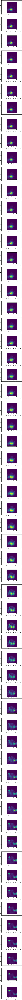

In [153]:
fig, ax = plt.subplots(60,figsize=(400,400))

for j in range(60):
    img = mpimg.imread(f'latent_explore/0/ts_{0}_{j}.png')
    ax[j].imshow(img)

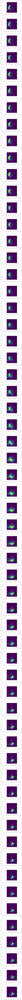

In [154]:
fig, ax = plt.subplots(60,figsize=(400,400))

for j in range(60):
    img = mpimg.imread(f'latent_explore/1/ts_{1}_{j}.png')
    ax[j].imshow(img)

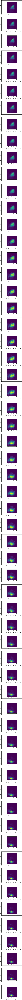

In [27]:
fig, ax = plt.subplots(60,figsize=(400,400))

for j in range(60):
    img = mpimg.imread(f'latent_explore/2/ts_{2}_{j}.png')
    ax[j].imshow(img)

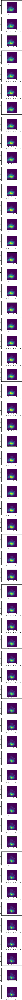

In [157]:
fig, ax = plt.subplots(60,figsize=(400,400))

for j in range(60):
    img = mpimg.imread(f'latent_explore/3/ts_{3}_{j}.png')
    ax[j].imshow(img)

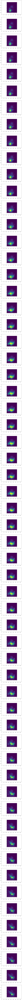

In [29]:
fig, ax = plt.subplots(60,figsize=(400,400))

for j in range(60):
    img = mpimg.imread(f'latent_explore/4/ts_{4}_{j}.png')
    ax[j].imshow(img)

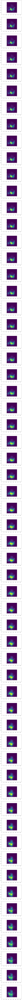

In [30]:
fig, ax = plt.subplots(60,figsize=(400,400))

for j in range(60):
    img = mpimg.imread(f'latent_explore/5/ts_{5}_{j}.png')
    ax[j].imshow(img)

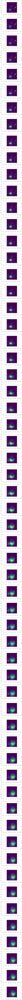

In [31]:
fig, ax = plt.subplots(60,figsize=(400,400))

for j in range(60):
    img = mpimg.imread(f'latent_explore/6/ts_{6}_{j}.png')
    ax[j].imshow(img)

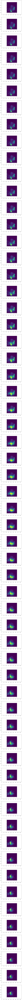

In [32]:
fig, ax = plt.subplots(60,figsize=(400,400))

for j in range(60):
    img = mpimg.imread(f'latent_explore/7/ts_{7}_{j}.png')
    ax[j].imshow(img)

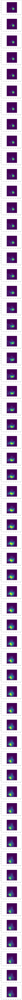

In [33]:
fig, ax = plt.subplots(60,figsize=(400,400))

for j in range(60):
    img = mpimg.imread(f'latent_explore/8/ts_{8}_{j}.png')
    ax[j].imshow(img)

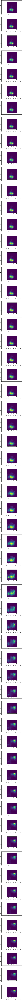

In [159]:
fig, ax = plt.subplots(60,figsize=(400,400))

for j in range(60):
    img = mpimg.imread(f'latent_explore/9/ts_{9}_{j}.png')
    ax[j].imshow(img)

In [36]:
print(HGVAE.mapping)

{0: 'Hand Clapping', 1: 'Right Hand Wave', 2: 'Left Hand Wave', 3: 'Right Arm CW', 4: 'Right Arm CCW', 5: 'Left Arm CW', 6: 'Left Arm CCW', 7: 'Arm Roll', 8: 'Air Drums', 9: 'Air Guitar', 10: 'Other'}


In [40]:
def single_sample_prediction(lats,excite_classifier):
    excite_classifier.eval()
    with torch.no_grad():
        logps = excite_classifier(lats)
    
    ps = torch.exp(logps.cuda())
    probab = list(ps.cpu().numpy()[0])

    probab = softmax(probab)
    
    return probab

In [41]:
fake_excite_lats = torch.zeros(1,10).to(HGVAE.device)
fake_excite_lats[0,9] = 3
predicted_probs = single_sample_prediction(fake_excite_lats,HGVAE.net.cls_sq)

In [42]:
print(predicted_probs)

[0.0286 0.0286 0.734  0.0286 0.0286 0.0375 0.0286 0.0286 0.0286 0.0286]


In [43]:
fake_excite_lats = torch.zeros(1,10).to(HGVAE.device)
fake_excite_lats[0,6] = -3
predicted_probs = single_sample_prediction(fake_excite_lats,HGVAE.net.cls_sq)
print(predicted_probs)

[0.0011 0.0011 0.0011 0.0011 0.0011 0.0011 0.0011 0.0011 0.0011 0.9903]


In [44]:
fake_excite_lats = torch.zeros(1,10).to(HGVAE.device)
fake_excite_lats[0,0] = -3
predicted_probs = single_sample_prediction(fake_excite_lats,HGVAE.net.cls_sq)
print(predicted_probs)

[ 0.  0.  0.  0.  0.  0.  0. nan  0.  0.]


/tmp/ipykernel_89994/2534654946.py:3: RuntimeWarning: overflow encountered in exp
  return np.exp(x) / np.sum(np.exp(x), axis=0)
/tmp/ipykernel_89994/2534654946.py:3: RuntimeWarning: invalid value encountered in true_divide
  return np.exp(x) / np.sum(np.exp(x), axis=0)


In [48]:
fake_excite_lats = torch.zeros(1,10).to(HGVAE.device)
fake_excite_lats[0,0] = 3
predicted_probs = single_sample_prediction(fake_excite_lats,HGVAE.net.cls_sq)
print(predicted_probs)

[0.0994 0.0994 0.0994 0.0994 0.0994 0.104  0.1004 0.0994 0.0998 0.0994]


In [49]:
fake_excite_lats = torch.zeros(1,10).to(HGVAE.device)
fake_excite_lats[0,9] = 3
fake_excite_lats[0,6] = -3
predicted_probs = single_sample_prediction(fake_excite_lats,HGVAE.net.cls_sq)
print(predicted_probs)

[0.0999 0.0999 0.0999 0.0999 0.0999 0.0999 0.0999 0.0999 0.0999 0.1008]


In [54]:
print(tgts_test[10])
print(lats_test[10][:10])
predicted_probs = single_sample_prediction(torch.unsqueeze(torch.Tensor(lats_test[10][:10]),0).to(HGVAE.device),HGVAE.net.cls_sq)
print(predicted_probs)

9
[-0.3219  0.4627  0.4351  0.0994  0.2318  0.6159 -0.8097 -0.5764  1.7572
  0.3148]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0. nan]


/tmp/ipykernel_89994/2534654946.py:3: RuntimeWarning: overflow encountered in exp
  return np.exp(x) / np.sum(np.exp(x), axis=0)
/tmp/ipykernel_89994/2534654946.py:3: RuntimeWarning: invalid value encountered in true_divide
  return np.exp(x) / np.sum(np.exp(x), axis=0)


In [57]:
fake_excite_lats = torch.zeros(1,10).to(HGVAE.device)
fake_excite_lats[0,8] = 1.7572
#fake_excite_lats[0,6] = -0.8097
predicted_probs = single_sample_prediction(fake_excite_lats,HGVAE.net.cls_sq)
print(predicted_probs)

[7.8737e-07 7.8761e-07 7.8732e-07 9.9999e-01 7.8748e-07 7.9022e-07
 7.8733e-07 7.8734e-07 8.0108e-07 8.7659e-07]


In [58]:
fake_excite_lats = torch.zeros(1,10).to(HGVAE.device)
#fake_excite_lats[0,8] = 1.7572
fake_excite_lats[0,6] = -0.8097
predicted_probs = single_sample_prediction(fake_excite_lats,HGVAE.net.cls_sq)
print(predicted_probs)

[0.0108 0.0106 0.0101 0.0107 0.0103 0.0101 0.0101 0.0104 0.0112 0.9057]


In [59]:
fake_excite_lats = torch.zeros(1,10).to(HGVAE.device)
fake_excite_lats[0,8] = 1.7572
fake_excite_lats[0,6] = -0.8097
predicted_probs = single_sample_prediction(fake_excite_lats,HGVAE.net.cls_sq)
print(predicted_probs)

[4.7133e-04 4.7132e-04 4.7130e-04 9.9513e-01 4.7131e-04 4.7130e-04
 4.7130e-04 4.7130e-04 4.7202e-04 1.0977e-03]


In [61]:
fake_excite_lats = torch.zeros(1,100).to(HGVAE.device)
fake_excite_lats[0,8] = 0.8097#1.7572
fake_excite_lats[0,6] = -1.7572
predicted_probs = single_sample_prediction(fake_excite_lats[:10],HGVAE.net.cls_sq)
print(predicted_probs)

[1.1627e-06 1.1615e-06 1.1614e-06 1.2642e-06 1.1615e-06 1.1614e-06
 1.1614e-06 1.1614e-06 1.1623e-06 9.9999e-01]


In [62]:
decoded_fake = HGVAE.net.decoder(fake_excite_lats)

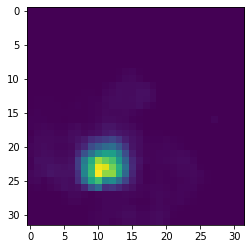

In [65]:
plt.imshow(decoded_fake[0,0].detach().cpu().numpy().T)

In [ ]:
decoded_test = HGVAE.net.decoder(torch.Tensor(lats_test).to(HGVAE.device))

3
[-1.7562 -2.1025 -1.9954 -2.2913 -0.0748  2.1665 -0.6035  0.5287  3.3984
 -0.3197]
3
[0. 0. 1.]


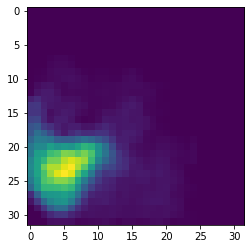

In [55]:
print(tgts_test[3])
print(lats_test[3][:10])
print(test_predictions[3])
print(test_top_three_conf[3])
plt.imshow(decoded_test[3][0].detach().cpu().numpy().T)

In [149]:
print(lats_test[220])

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


In [88]:
# wtf is this latent space really doing? while it seems disentangled when looking at tsne and some of those traversals I did it is difficult to see the logic in what the classifier is learning
# which might be why the other class is treated like it is. Also, mrgrhrgr
# really need to look more closely at this latent space. It is clear that it's not as simple as "this one variable is this class", these should be learning some kinda features then that are relevant to the classes
# but what is still not clear
# this also indicates that I could use more latent variables perhaps and see if that gives any improvement... 
fake_lats = lats_test[3]
fake_lats[:] = 0
print(fake_lats)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


In [89]:
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))

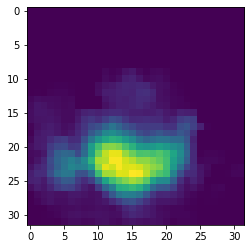

In [90]:
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)

[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


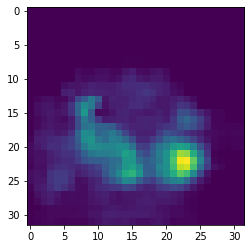

In [92]:
fake_lats[0] = 1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[0] = 0

[-1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


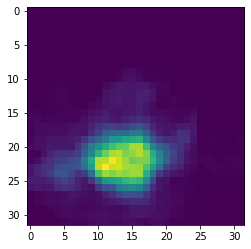

In [102]:
fake_lats[0] = -1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[0] = 0

[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


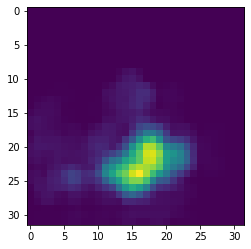

In [93]:
fake_lats[1] = 1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[1] = 0

[ 0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


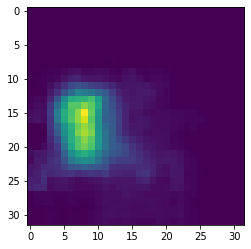

In [103]:
fake_lats[1] = -1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[1] = 0

[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


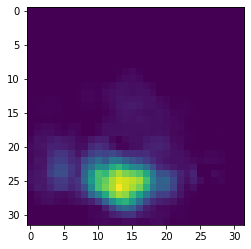

In [94]:
fake_lats[2] = 1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[2] = 0


[ 0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


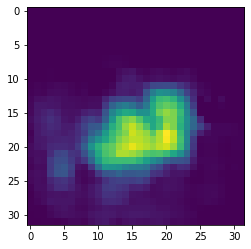

In [104]:
fake_lats[2] = -1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[2] = 0


[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


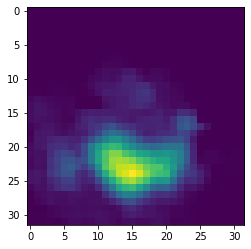

In [95]:
fake_lats[3] = 1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[3] = 0


[ 0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


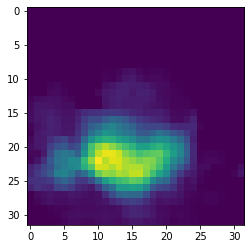

In [105]:
fake_lats[3] = -1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[3] = 0


[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


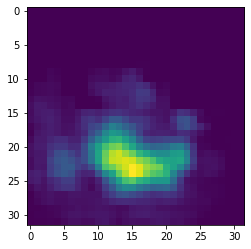

In [96]:
fake_lats[4] = 1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[4] = 0


[ 0.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


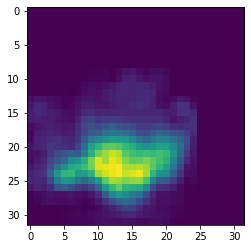

In [106]:
fake_lats[4] = -1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[4] = 0


[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


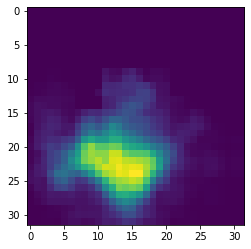

In [97]:
fake_lats[5] = 1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[5] = 0


[ 0.  0.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


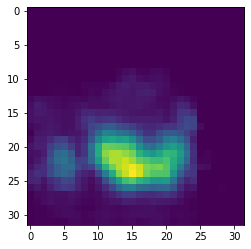

In [107]:
fake_lats[5] = -1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[5] = 0


[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


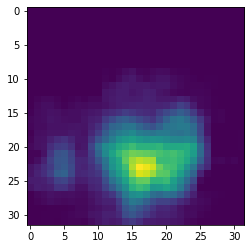

In [98]:
fake_lats[6] = 1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[6] = 0


[ 0.  0.  0.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


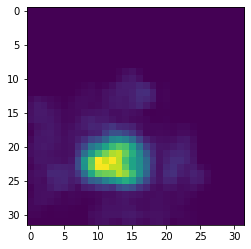

In [108]:
fake_lats[6] = -1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[6] = 0


[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


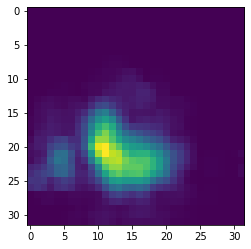

In [99]:
fake_lats[7] = 1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[7] = 0


[ 0.  0.  0.  0.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


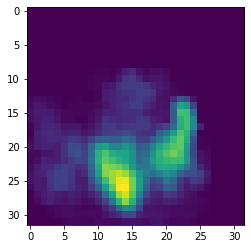

In [109]:
fake_lats[7] = -1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[7] = 0


[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


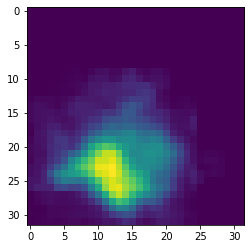

In [100]:
fake_lats[8] = 1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[8] = 0


[ 0.  0.  0.  0.  0.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


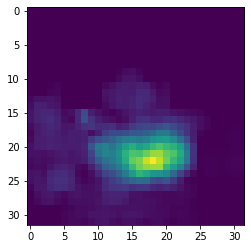

In [110]:
fake_lats[8] = -1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[8] = 0


[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


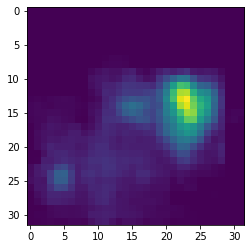

In [101]:
fake_lats[9] = 1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[9] = 0


[0.  0.  0.  0.  0.  0.  0.  0.  0.  0.5 0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0. ]


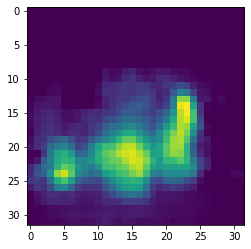

In [112]:
fake_lats[9] = .5
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[9] = 0


[ 0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.5  0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]


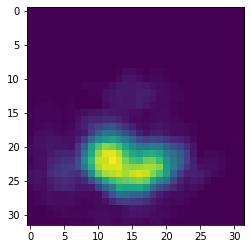

In [113]:
fake_lats[9] = -.5
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[9] = 0


[ 0.  0.  0.  0.  0.  0.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


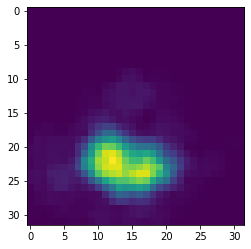

In [111]:
fake_lats[9] = -1
print(fake_lats)
fake_test = HGVAE.net.decoder(torch.unsqueeze(torch.Tensor(fake_lats).to(HGVAE.device),0))
plt.imshow(fake_test[0][0].detach().cpu().numpy().T)
fake_lats[9] = 0


In [75]:
print(fake_lats)

[0. 0. 0. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


In [23]:
test_acc, test_predictions, test_top_three_label, test_top_three_conf, test_top_three_acc = eval_accuracy_classifier_as_head(encoder_out, new_t, classifier)

In [27]:
test_acc

0.05555555555555555

In [24]:
print(test_top_three_label)

[[7. 2. 0.]
 [3. 6. 0.]
 [6. 8. 0.]
 [8. 6. 0.]
 [4. 8. 0.]
 [4. 3. 6.]
 [6. 8. 0.]
 [3. 2. 6.]
 [8. 6. 0.]
 [6. 2. 0.]
 [8. 6. 0.]
 [2. 6. 0.]
 [4. 8. 0.]
 [2. 7. 0.]
 [6. 8. 0.]
 [2. 6. 0.]
 [8. 2. 0.]
 [8. 0. 6.]]


In [25]:
new_t

tensor([9, 9, 5, 5, 9, 3, 6, 4, 5, 0, 6, 3, 2, 5, 2, 8, 5, 0], device='cuda:1')

In [26]:
test_top_three_conf

array([[0.1047, 0.1147, 0.1696],
       [0.105 , 0.105 , 0.1308],
       [0.1067, 0.1118, 0.1739],
       [0.1   , 0.1082, 0.247 ],
       [0.1055, 0.1103, 0.117 ],
       [0.1113, 0.1191, 0.1316],
       [0.104 , 0.1206, 0.2939],
       [0.1122, 0.1181, 0.1258],
       [0.1083, 0.1109, 0.1505],
       [0.1118, 0.1252, 0.134 ],
       [0.0967, 0.1513, 0.4038],
       [0.108 , 0.1697, 0.178 ],
       [0.1063, 0.1164, 0.1395],
       [0.1063, 0.1077, 0.1698],
       [0.1108, 0.1121, 0.1162],
       [0.1114, 0.1221, 0.1934],
       [0.1059, 0.1068, 0.1188],
       [0.1167, 0.1369, 0.1549]])

In [28]:
# try spiking output layer instead maybe, and make sure to replace the 128 feature output layer with the classifier
# instead. This is for the spiking encoder I mean. I'm trying to see if during the training
# it's really learned any useful feature disentanglement.
# If not, then basically I trained a good classifier on the latent space rather than good feature extractors
base_layer = nn.Linear(8912, 10).to(HGVAE.device)
HGVAE.net.encoder.LIF_layers[4]  = HGVAE.net.encoder.lif_layer_type[-1](base_layer,
             alpha=HGVAE.params['alpha'][0],
             beta=HGVAE.params['beta'][0],
             alpharp=HGVAE.params['alpharp'][0],
             deltat=HGVAE.params['deltat'],
             do_detach=True if HGVAE.params['method'] == 'rtrl' else False).to(HGVAE.device)




In [32]:
HGVAE.net.encoder.LIF_layers[3]

LIFLayer(
  (base_layer): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
)

In [29]:
encoder_out = HGVAE.net.encoder_forward(HGVAE.data_batch)

 ** On entry to SGEMM  parameter number 10 had an illegal value


RuntimeError: CUDA error: CUBLAS_STATUS_INVALID_VALUE when calling `cublasSgemm( handle, opa, opb, m, n, k, &alpha, a, lda, b, ldb, &beta, c, ldc)`

In [75]:
test_acc, test_predictions, test_top_three_label, test_top_three_conf, test_top_three_acc = eval_accuracy_classifier_as_head(encoder_out, new_t, classifier)